In [286]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
import os
import sys

## I- Data Visualization and First Analysis

#### i- Data Statistics

In [287]:
data_nba = pd.read_csv('nba_logreg.csv')

In [288]:
data_nba.head()

,Name,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,...,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
0,Brandon Ingram,36,27.4,7.4,2.6,7.6,34.7,0.5,2.1,25.0,...,2.3,69.9,0.7,3.4,4.1,1.9,0.4,0.4,1.3,0.0
1,Andrew Harrison,35,26.9,7.2,2.0,6.7,29.6,0.7,2.8,23.5,...,3.4,76.5,0.5,2.0,2.4,3.7,1.1,0.5,1.6,0.0
2,JaKarr Sampson,74,15.3,5.2,2.0,4.7,42.2,0.4,1.7,24.4,...,1.3,67.0,0.5,1.7,2.2,1.0,0.5,0.3,1.0,0.0
3,Malik Sealy,58,11.6,5.7,2.3,5.5,42.6,0.1,0.5,22.6,...,1.3,68.9,1.0,0.9,1.9,0.8,0.6,0.1,1.0,1.0
4,Matt Geiger,48,11.5,4.5,1.6,3.0,52.4,0.0,0.1,0.0,...,1.9,67.4,1.0,1.5,2.5,0.3,0.3,0.4,0.8,1.0


In [289]:
data_nba.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1340 entries, 0 to 1339
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Name         1340 non-null   object 
 1   GP           1340 non-null   int64  
 2   MIN          1340 non-null   float64
 3   PTS          1340 non-null   float64
 4   FGM          1340 non-null   float64
 5   FGA          1340 non-null   float64
 6   FG%          1340 non-null   float64
 7   3P Made      1340 non-null   float64
 8   3PA          1340 non-null   float64
 9   3P%          1329 non-null   float64
 10  FTM          1340 non-null   float64
 11  FTA          1340 non-null   float64
 12  FT%          1340 non-null   float64
 13  OREB         1340 non-null   float64
 14  DREB         1340 non-null   float64
 15  REB          1340 non-null   float64
 16  AST          1340 non-null   float64
 17  STL          1340 non-null   float64
 18  BLK          1340 non-null   float64
 19  TOV   

In [337]:
data_nba.columns    

Index(['Name', 'GP', 'MIN', 'PTS', 'FGM', 'FGA', 'FG%', '3P Made', '3PA',
       '3P%', 'FTM', 'FTA', 'FT%', 'OREB', 'DREB', 'REB', 'AST', 'STL', 'BLK',
       'TOV', 'TARGET_5Yrs'],
      dtype='object')

In [290]:
data_nba.describe()

,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,FTA,FT%,OREB,DREB,REB,AST,STL,BLK,TOV,TARGET_5Yrs
count,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1329.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000,1340.000000
mean,60.414179,17.624627,6.801493,2.629104,5.885299,44.169403,0.247612,0.779179,19.308126,1.297687,1.821940,70.300299,1.009403,2.025746,3.034478,1.550522,0.618507,0.368582,1.193582,0.620149
std,17.433992,8.307964,4.357545,1.683555,3.593488,6.137679,0.383688,1.061847,16.022916,0.987246,1.322984,10.578479,0.777119,1.360008,2.057774,1.471169,0.409759,0.429049,0.722541,0.485531
min,11.000000,3.100000,0.700000,0.300000,0.800000,23.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.300000,0.000000,0.000000,0.000000,0.100000,0.000000
25%,47.000000,10.875000,3.700000,1.400000,3.300000,40.200000,0.000000,0.000000,0.000000,0.600000,0.900000,64.700000,0.400000,1.000000,1.500000,0.600000,0.300000,0.100000,0.700000,0.000000
50%,63.000000,16.100000,5.550000,2.100000,4.800000,44.100000,0.100000,0.300000,22.400000,1.000000,1.500000,71.250000,0.800000,1.700000,2.500000,1.100000,0.500000,0.200000,1.000000,1.000000
75%,77.000000,22.900000,8.800000,3.400000,7.500000,47.900000,0.400000,1.200000,32.500000,1.600000,2.300000,77.600000,1.400000,2.600000,4.000000,2.000000,0.800000,0.500000,1.500000,1.000000
max,82.000000,40.900000,28.200000,10.200000,19.800000,73.700000,2.300000,6.500000,100.000000,7.700000,10.200000,100.000000,5.300000,9.600000,13.900000,10.600000,2.500000,3.900000,4.400000,1.000000


#### ii- Data Visualization: Distribution/Mean/Std/Skewness

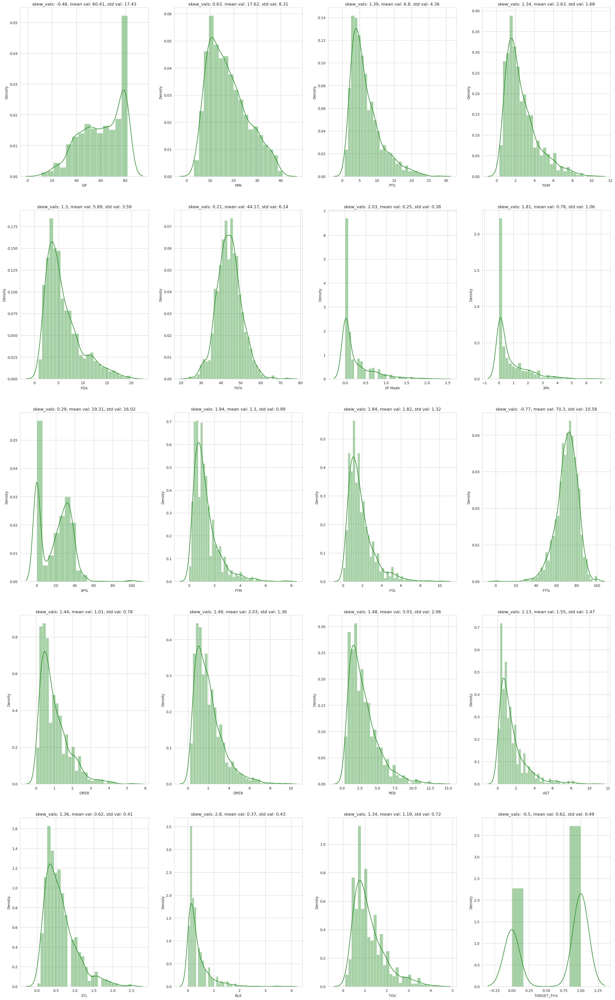

In [ ]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

data_visu = data_nba.select_dtypes(include=numerics)
skew_vals = data_visu.skew()
mean_vals = data_visu.mean()
std_vals = data_visu.std()
fig, axes = plt.subplots(nrows = 5, ncols = 4)    # axes is 2d array (3x3)
axes = axes.flatten()         # Convert axes to 1d array of length 20
fig.set_size_inches(30, 50)
i=0
for ax, col in zip(axes, data_visu.columns):
  sns.distplot(data_visu[col], ax = ax, color='forestgreen')
  ax.set_title(col)
  ax.set_title("skew_vals: {}, mean val: {}, std val: {}".format(skew_vals[i].round(2),mean_vals[i].round(2),std_vals[i].round(2)))
  i+=1

Most of the observed features can be considered as positive skewed (3P Made, BLK, AST...) with one negative skewed feature (FT%).

Skewness it is a measurement of how the data distribution is asymmetric, or in other words how the observed data distribution deviates from a normal distribution. 

It is really important to apply transformations to those features distributions since ML algorithms assume that the data being prossed follows a normal distribution, or at least a symetric distribution.

To deal with skewness many approaches can be applied to the data. 
- log transform
- square root transformation
- Box Cox transformation
- Square transformation ....

Since all the data we have at hand is positive skewed, we can for example apply log trasnformation.

It is worth noting that some models, like tree-based machine learning algorithms, are less sensitive to skewness and might not require data transformation.

#### iii- Box Plots

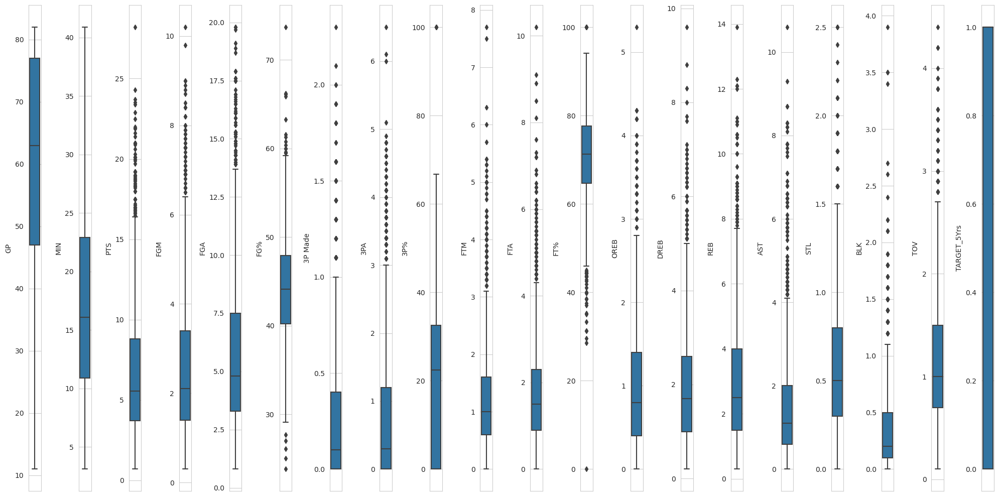

In [292]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_bxp = data_visu.copy()

# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Initialize the figure size
plt.figure(figsize=(20, 10))  # You can adjust the size as needed

# Plotting boxplots for each column
# This loop will create a box plot for each feature in the DataFrame
for i, column in enumerate(df_bxp.columns, 1):
    plt.subplot(1, len(df_bxp.columns), i)
    sns.boxplot(y=df_bxp[column])
    plt.tight_layout()

plt.show()  # Display the plot


Given the box plots we can see that we have multiple outliers. However, removing them will certaintly lead to a loss of valuable information. This is because we have a relatively small dataset, so removing this at this stage might reduce the model's ability to generalize.

We will therefore applying a high treshhold on the upper and lower bounds (3*IQR)

In [293]:
# Function to remove outliers based on IQR
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    
    # Define bounds for what is considered an outlier
    lower_bound = Q1 - 3 * IQR
    upper_bound = Q3 + 3 * IQR
    
    # Filter out outliers and return the DataFrame without outliers
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply the function to each numeric column in the DataFrame if you wish to remove outliers from all numeric columns
# Assuming you want to clean the entire DataFrame from outliers in all numeric columns
# numeric_cols = df_bxp.select_dtypes(include=['number']).columns.tolist()
clean_df = df_bxp.copy()

for col in df_bxp:
    clean_df = remove_outliers(clean_df, col)

In [294]:
df_bxp = clean_df.copy()

#### iv- Scatter Plots

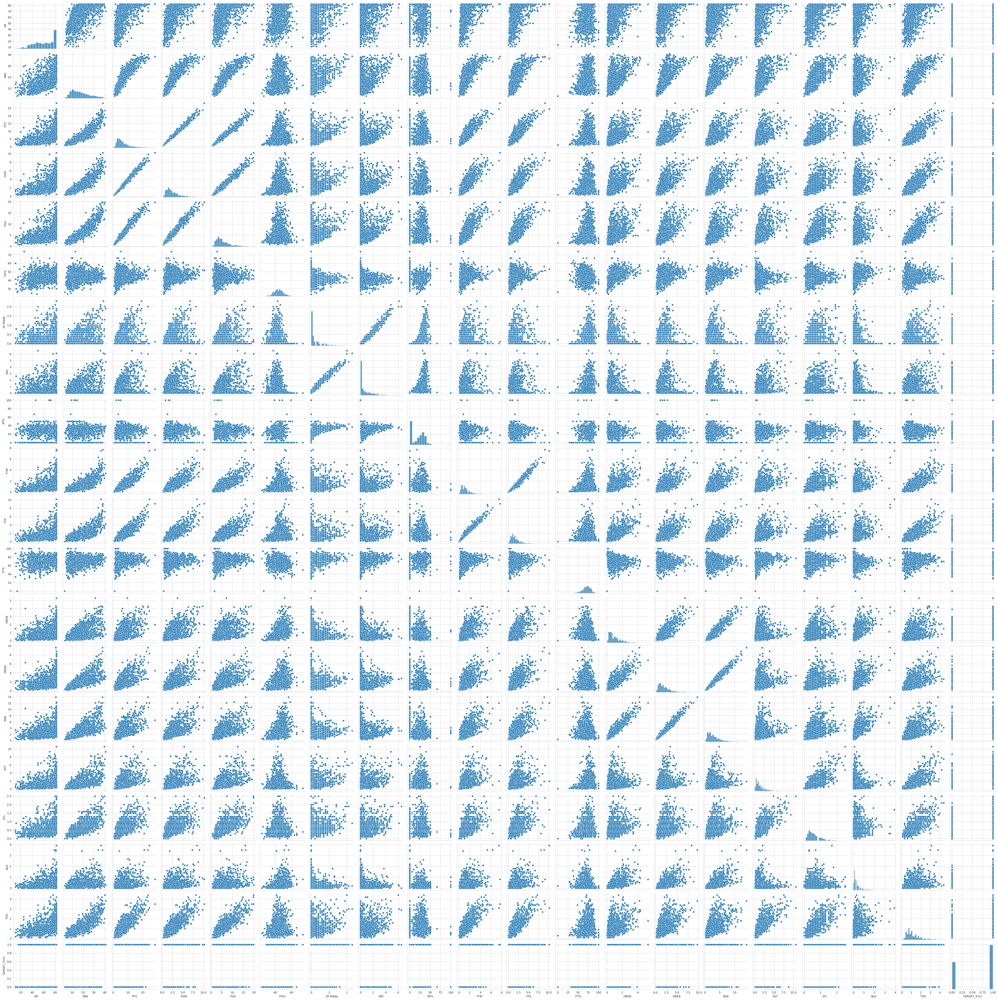

In [161]:
sns.pairplot(df_bxp)
plt.show()

An important visualization in my opinion is the scatter plot.

It will provide for each pair of features the relationship between them.

We can already see some relationships that can catch our eyes. for instance the linear relationship between FGA, FGM and PTS.

As for our objective feature we can see that the number of 0 and 1 are almost equally distributed over the distribution of the different features. However, some balancing techniques could improved the predictive effectivness of our model. 

#### v- Correlation Heatmap

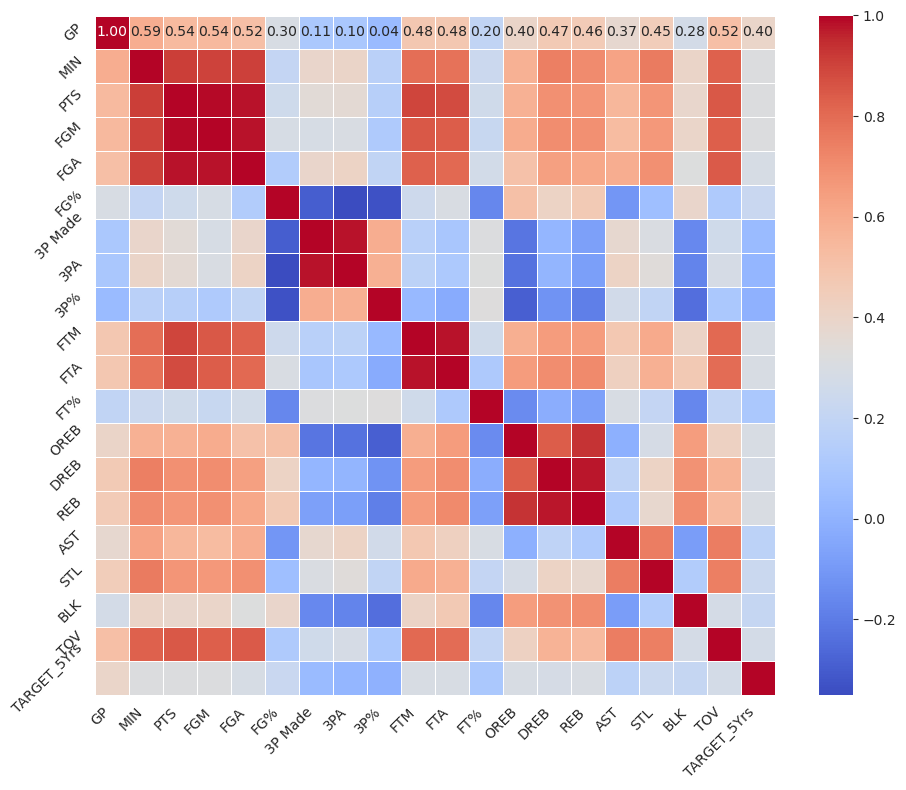

In [170]:
corr = df_bxp.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', 
            cbar=True, square=True, linewidths=.5)

# Improve the visibility of the heatmap
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

As a complementary to Scatter plots we have the corr heatmaps.

They provide a powerfull tool to quicly identify highly correlated features in the dataset.

We can see from the plot that the variables: FGA, FGM and PTS are highly correlated, which in accordance with our previous conclusions.

We see also that 3PA and 3P Made are highly positivly correlated, same for REB DREB.

This insights are of a great importance since it can give us some ideas on which feature/variable can be discarded from the training. In fact, correlated features affect the training of different ml algorithms:
- For example, for linear models (linear and logistic regression) the interpretation of coefficients can be challenging in such case. It also can lead to unstable estimates of coefficients, where small changes in the data could lead to huge changes in the hp/coefficients.
- Corerlated features can exacerbate overfitting since the model might use redundant information to make decisions, making it less generallizable to unseen data.

To handle correlated features one can:
- Feature selection: to remove redundant features, we can base our analysis on the correlation metrics or more sophisticated methods like feature importance scores from tree-based models.
- Regularization: such as Lasso can penalize some coeficients and drop them to zero, efefctively performing feature selection.
- Dimensionality Reduction: Like PCA could combine multiple correlated features into one.

## II- Feature Engineering

#### 0- Special case of the features with percentage

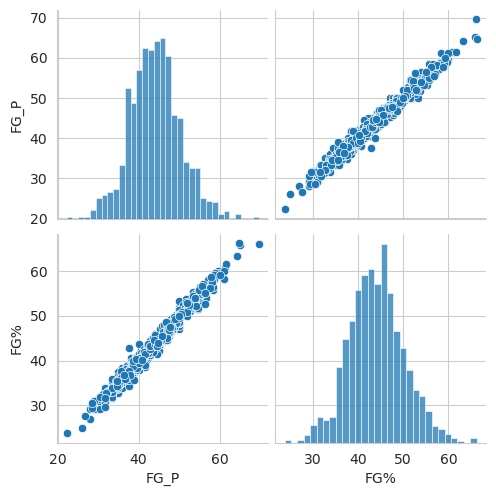

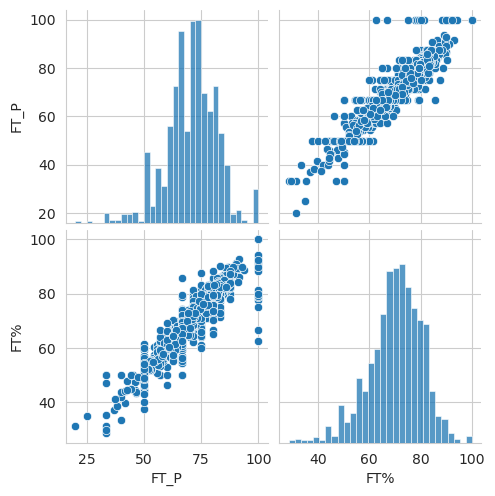

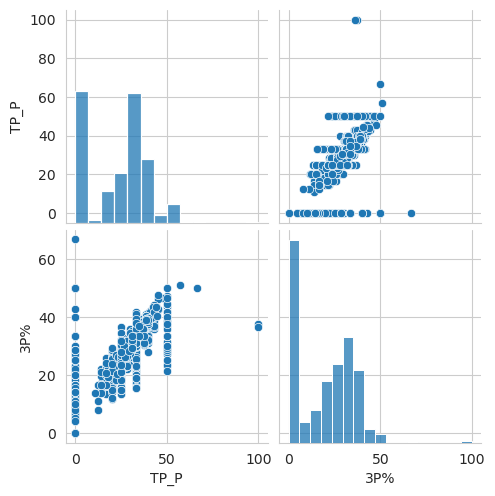

In [295]:
df = df_bxp.copy()
df["FG_P"] = (df["FGM"] / df["FGA"])*100
df["FT_P"] = (df["FTM"] / df["FTA"])*100
df["TP_P"] = (df["3P Made"] / df["3PA"])*100
sns.pairplot(df[['FG_P','FG%']])
plt.show()
sns.pairplot(df[['FT_P','FT%']])
plt.show()
sns.pairplot(df[['TP_P','3P%']])
plt.show()

We can see that the correlation between the features with percentages, ie 3P%, FT% and FG% are highly linearly correlated with our defined percentages. We'll see later on during the feature selection which of them are more important during the inference of our model.

#### i- Missing values

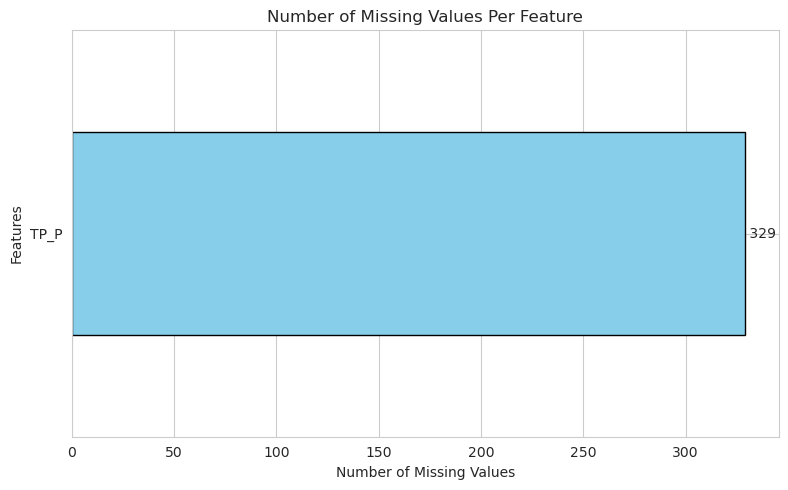

In [296]:
missing_counts = df.isnull().sum()

# Filter out columns that have no missing values to reduce clutter
missing_counts = missing_counts[missing_counts > 0]

# Sorting missing values in descending order
missing_counts.sort_values(inplace=True)

# Plotting the bar plot
plt.figure(figsize=(8, 5))  # Adjust the figure size as needed
bars = missing_counts.plot(kind='barh', color='skyblue', edgecolor='black')
plt.title('Number of Missing Values Per Feature')
plt.xlabel('Number of Missing Values')
plt.ylabel('Features')

# Adding text annotations on the bars
for bar in bars.patches:
    plt.text(bar.get_width(),  # Position text slightly right of the bar end
             bar.get_y() + bar.get_height() / 2,  # Position text at the vertical center of the bar
             f' {int(bar.get_width())}',  # Text to display (number of missing values)
             va='center')  # Center alignment for the vertical position

plt.tight_layout()  # Adjust layout to make room for label
plt.show()

The idea here is to drop the missing values of 3P% and replace the missing values of TP_P and FT_P by the values of 3P% and FT% respectively

In [297]:
# Step 1: Drop rows where '3P%' is missing
# df.dropna(subset=['3P%'], inplace=True)
df["3P%"].fillna(0, inplace=True)

# Step 2: Replace missing values in 'TP_P' with values from '3P%' and in 'FT_P' with values from 'FT%'
df['TP_P'] = df['TP_P'].fillna(df['3P%'])
df['FT_P'] = df['FT_P'].fillna(df['FT%'])

We notice that the samples that have missing values on the 3P% feature are the samples that have 0 3PA. Because the ratio is a division by zero resulting in an infinite value. For sake of simplicity we will be replacing those values by an epsilon close to zero.

Note here that this has been done before clearing out the outliers. I noticed that the outliers correspond perfectly to the case we 3P% is missing.



#### ii- Skewness

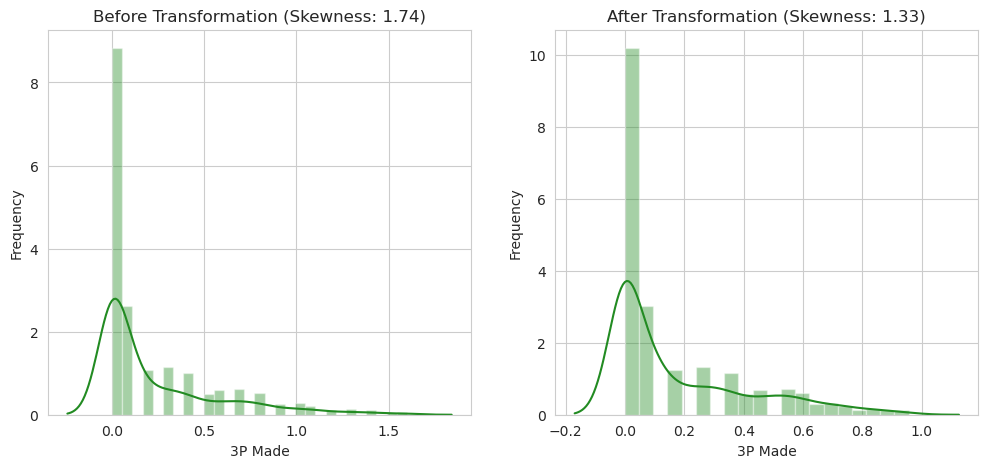

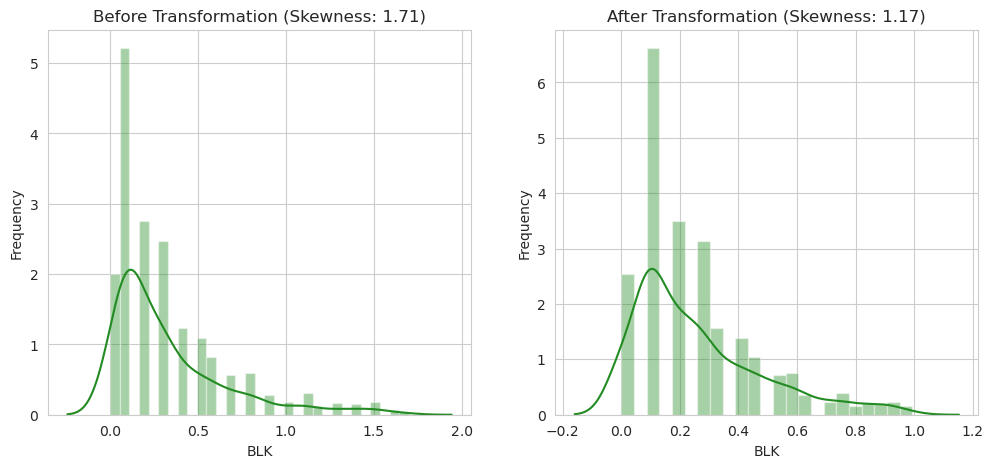

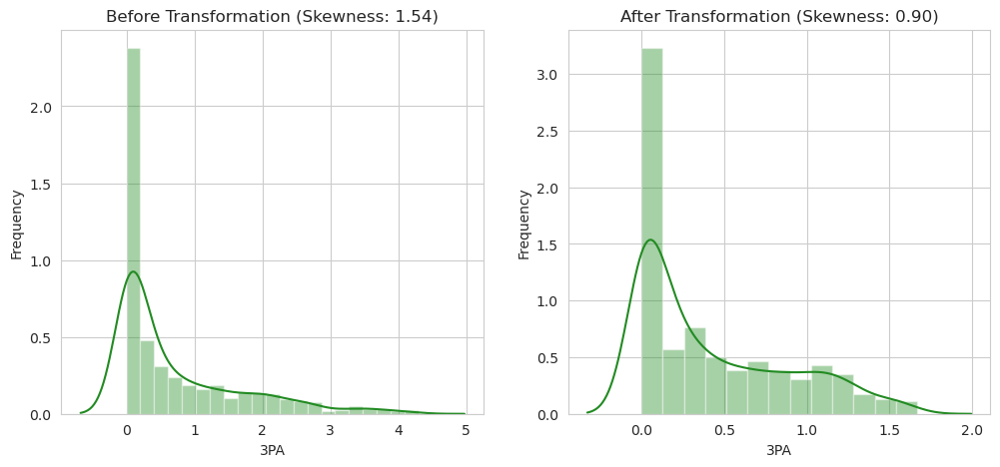

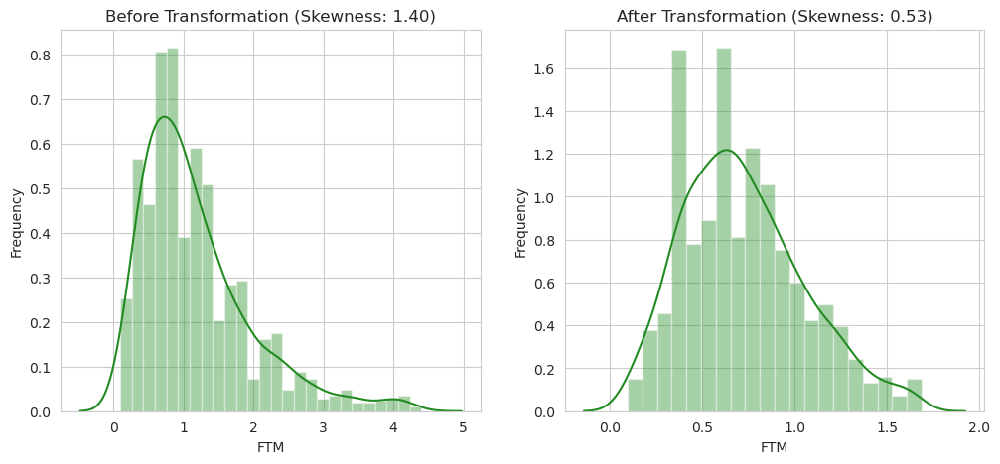

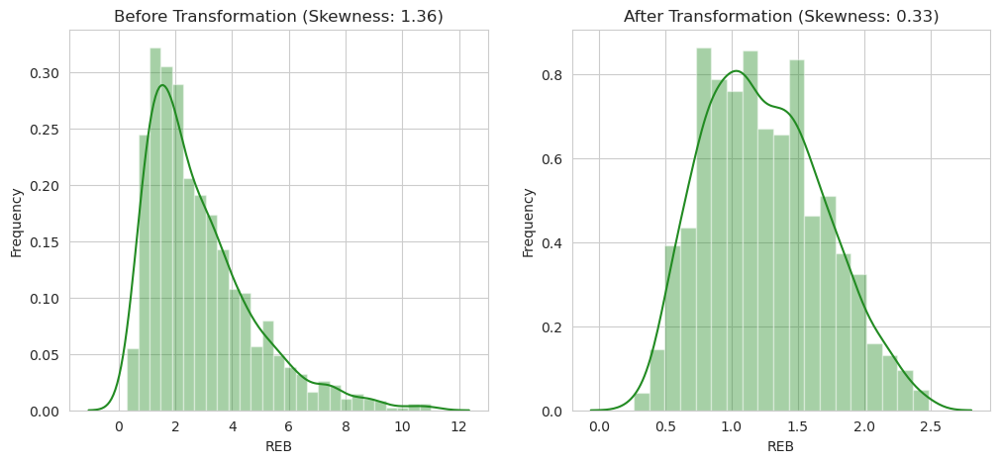

...

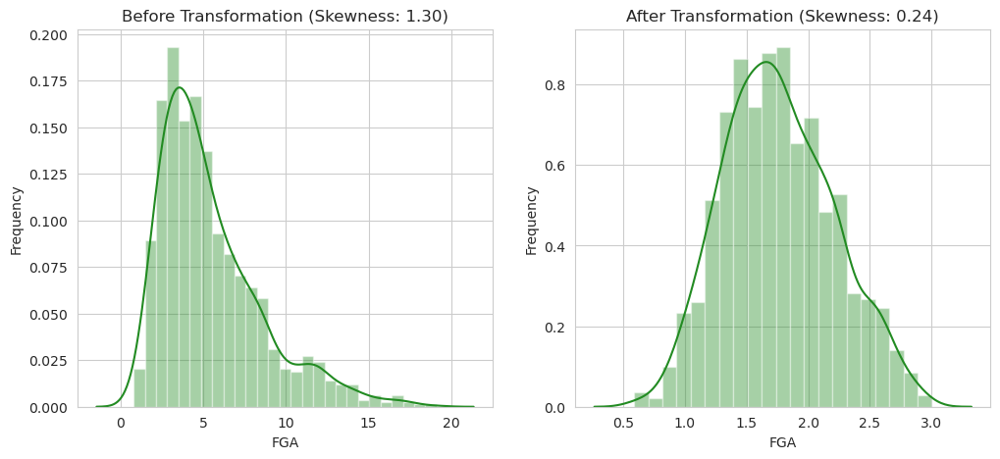

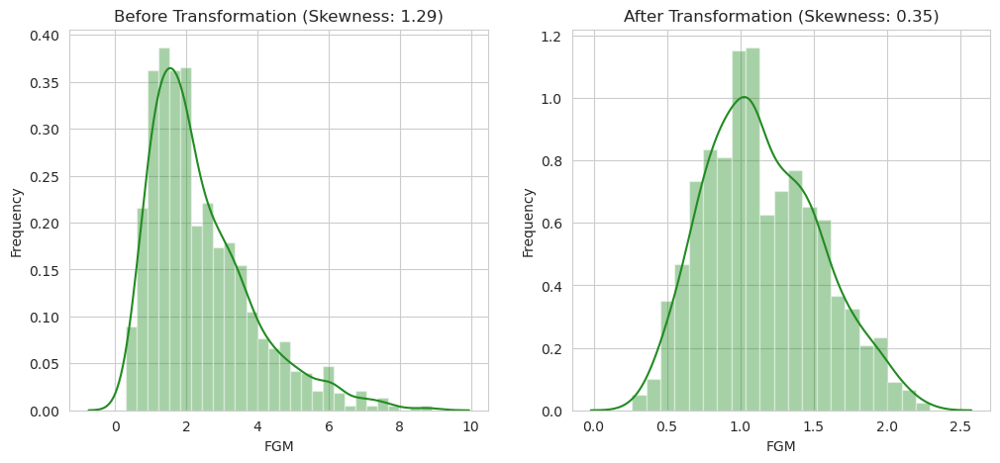

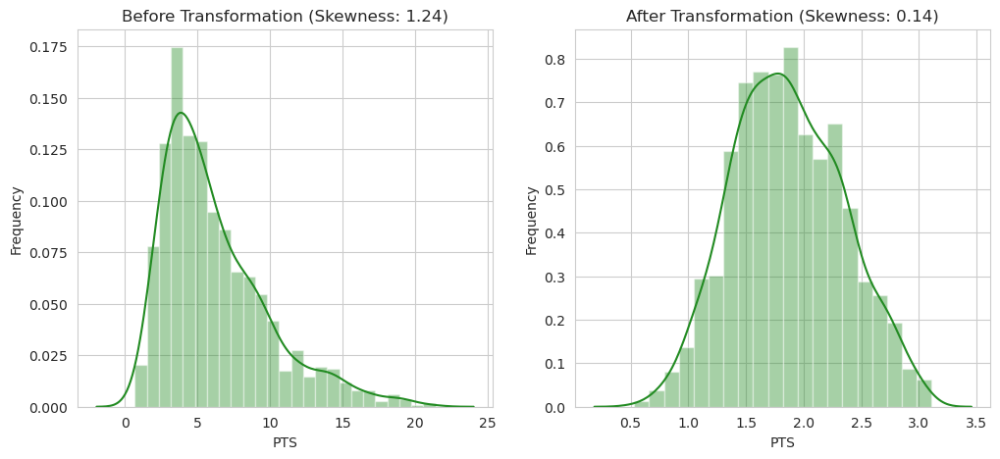

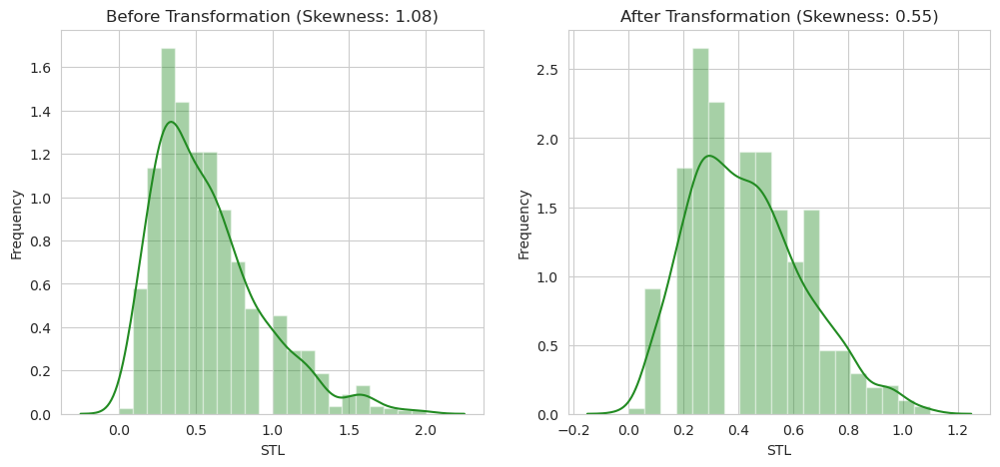

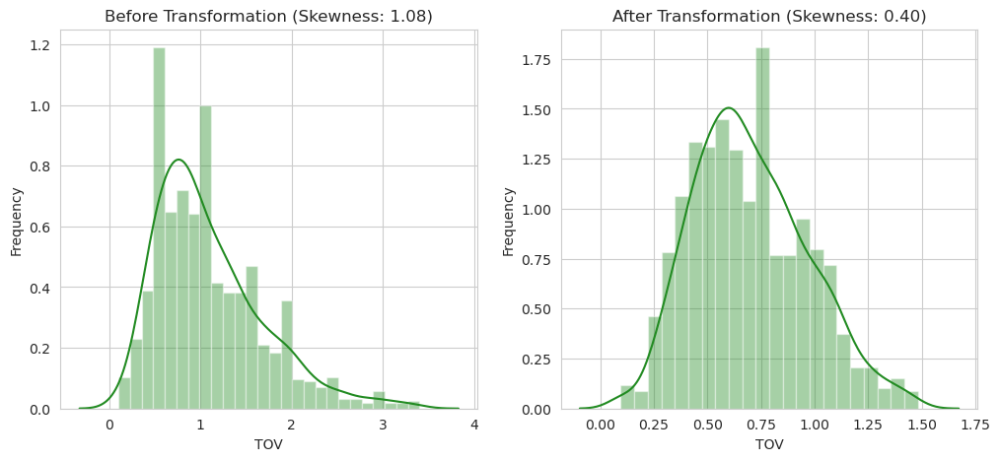

In [298]:
numerical_feats = df.copy()

# Define the skewness threshold
skewness_threshold = 1.   # You can adjust this value as needed 0.7 for example to include FT%
skew_vals = numerical_feats.skew()
# Select the skewed columns
skewed_features = (skew_vals
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {}'.format(skewness_threshold)))
# # Apply log transformation (np.log1p to handle zero values)
for feature in skewed_features.T:
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    #before transformation
    sns.distplot(df[feature], ax = ax[0], color='forestgreen')
    ax[0].set_xlabel(feature)
    ax[0].set_ylabel('Frequency')
    ax[0].set_title("Before Transformation (Skewness: {:.2f})".format(skew_vals[feature]))
    #after transformation
    numerical_feats[feature] = np.log1p(numerical_feats[feature])
    sns.distplot(numerical_feats[feature], ax = ax[1], color='forestgreen')
    ax[1].set_xlabel(feature)
    ax[1].set_ylabel('Frequency')
    ax[1].set_title("After Transformation (Skewness: {:.2f})".format(numerical_feats[feature].skew()))
    # plt.show()

#### ii- Standardization (Z-score normalization)

In [299]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import joblib

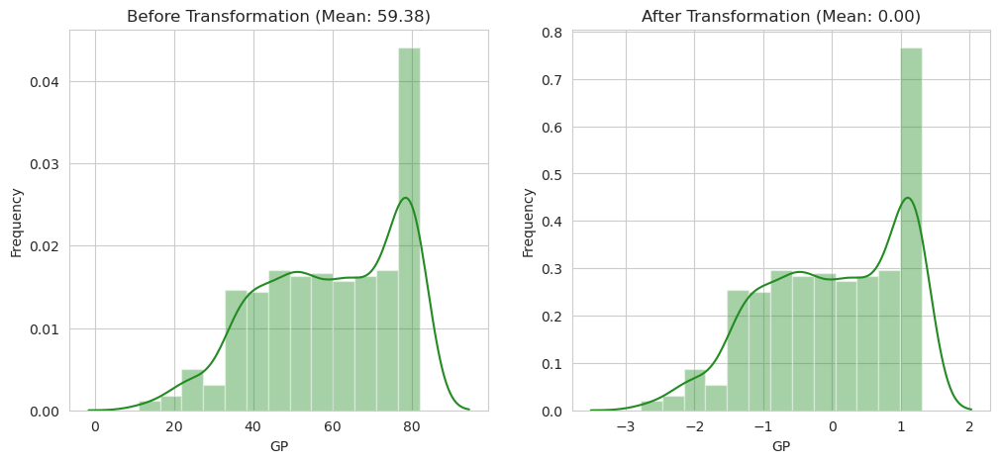

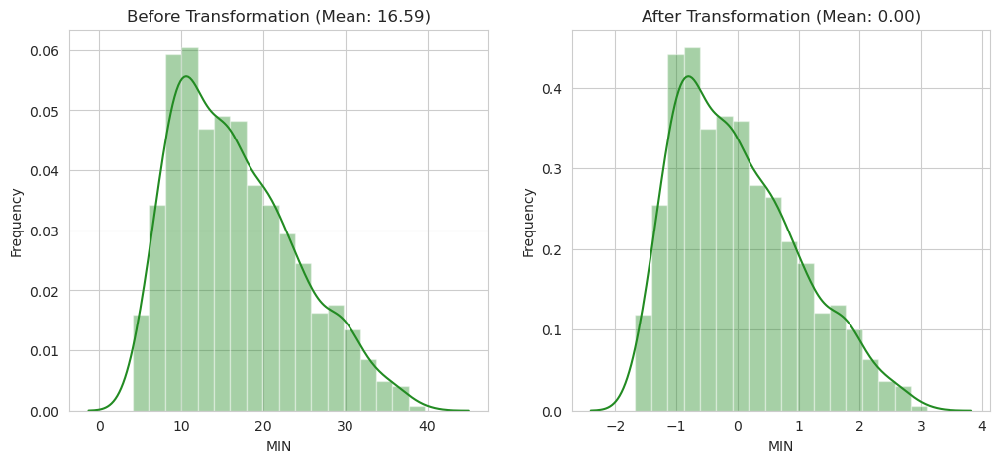

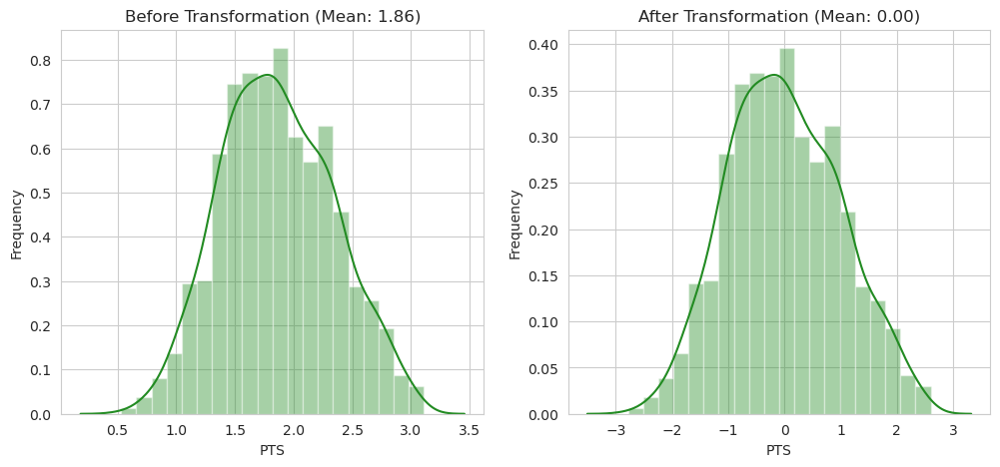

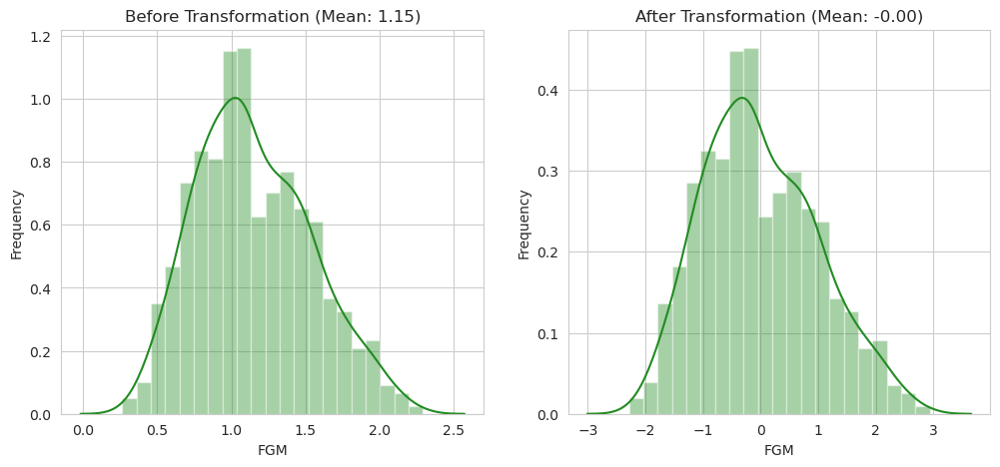

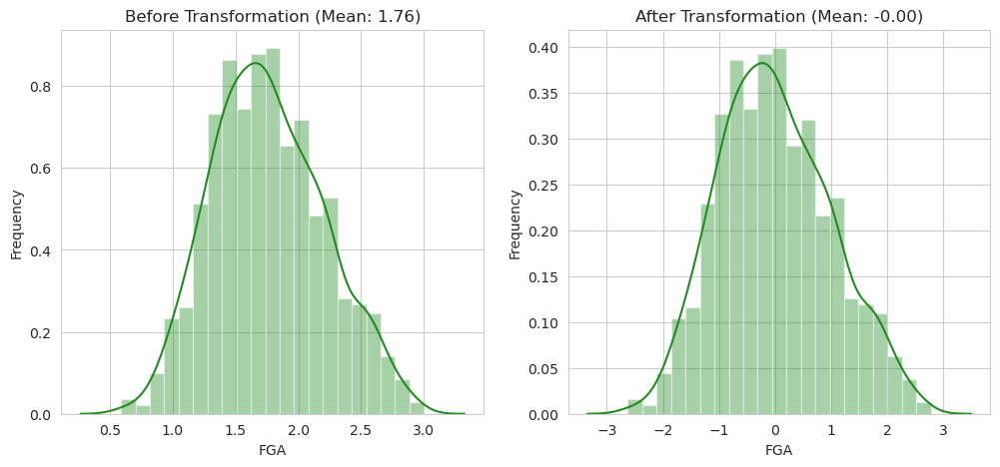

...

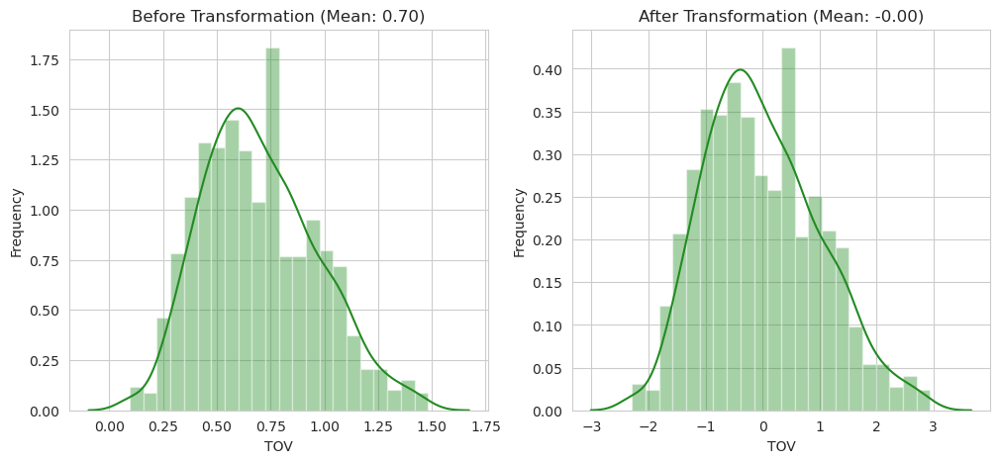

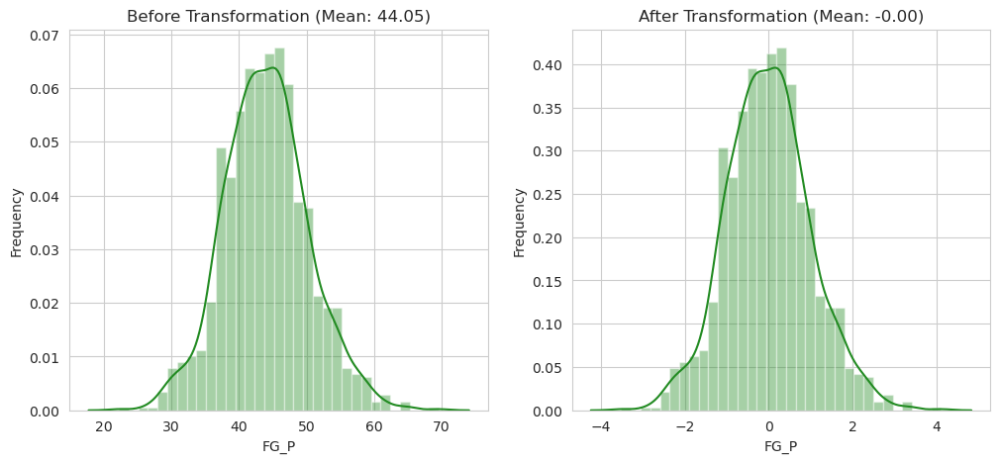

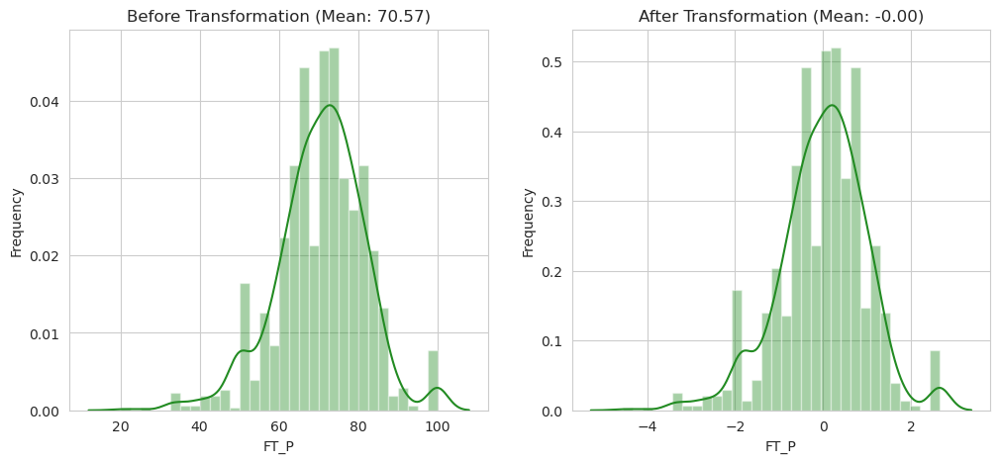

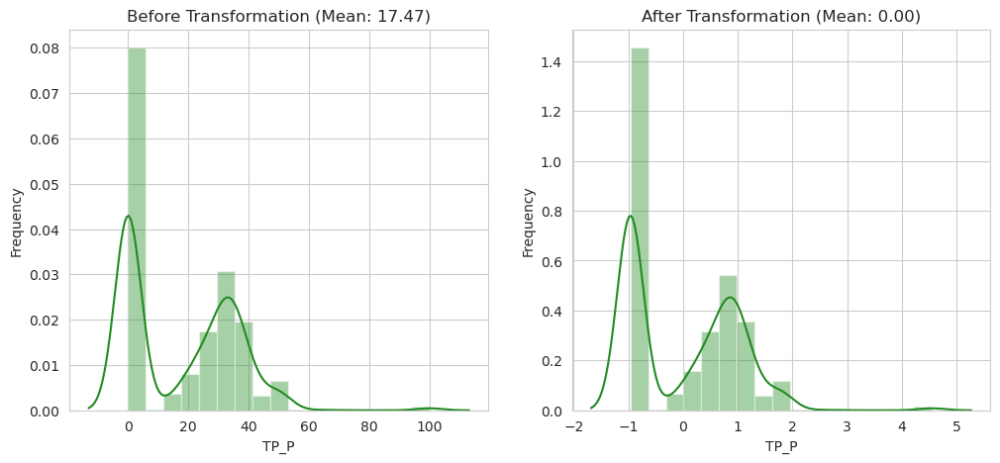

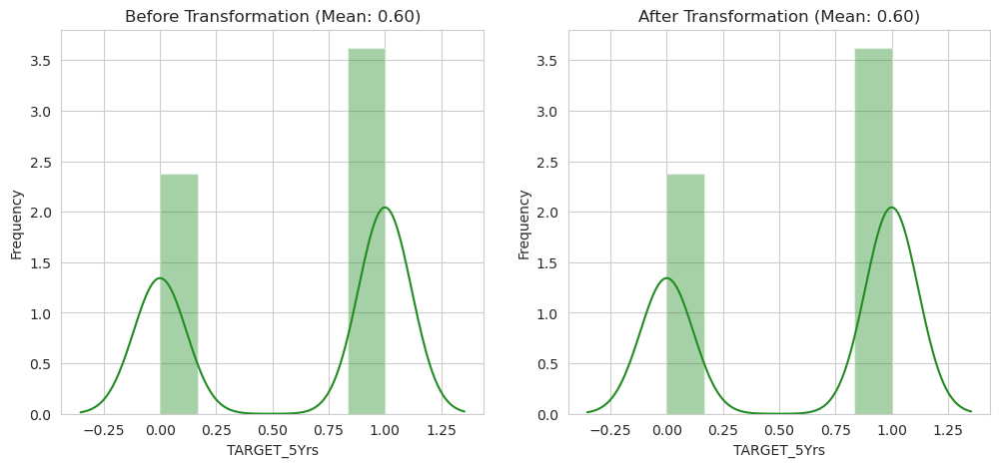

['scaler.pkl']

In [300]:
# Select numerical features
normalized_feats = numerical_feats.drop(columns="TARGET_5Yrs").copy() # Do not include the target variable
# Apply the z-score scaling
scaler = StandardScaler()
# scaler = MinMaxScaler()
normalized_feats = pd.DataFrame(scaler.fit_transform(normalized_feats), columns=normalized_feats.columns, index=numerical_feats.index)
normalized_feats['TARGET_5Yrs'] = numerical_feats['TARGET_5Yrs'].copy()
for feature in normalized_feats:
        # normalized_feats[feature] = scaler.fit_transform(normalized_feats[[feature]])
        fig, ax = plt.subplots(1, 2, figsize=(12, 5))
        #before transformation
        sns.distplot(numerical_feats[feature], ax = ax[0], color='forestgreen')
        ax[0].set_xlabel(feature)
        ax[0].set_ylabel('Frequency')
        ax[0].set_title("Before Transformation (Mean: {:.2f})".format(numerical_feats[feature].mean().round(2)))
        #after transformation
        sns.distplot(normalized_feats[feature], ax = ax[1], color='forestgreen')
        ax[1].set_xlabel(feature)
        ax[1].set_ylabel('Frequency')
        ax[1].set_title("After Transformation (Mean: {:.2f})".format(normalized_feats[feature].mean().round(2)))
        plt.show()

joblib.dump(scaler, 'scaler.pkl')

## III- Modeling

#### i- First attempt

In [301]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, recall_score, confusion_matrix, roc_auc_score, f1_score, precision_score

In [327]:
X = normalized_feats.drop(columns="TARGET_5Yrs")
y = normalized_feats["TARGET_5Yrs"]
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_val)
print(f"Accuracy on Validation Set: {accuracy_score(y_val, y_pred)}")
print(f"recall on Validation Set: {recall_score(y_val, y_pred)}")
print(f"precision on Validation Set: {precision_score(y_val, y_pred)}")
print(f"confusion_matrix on Validation Set: {confusion_matrix(y_val, y_pred)}")
print(classification_report(y_val, y_pred))

Accuracy on Validation Set: 0.7459677419354839
recall on Validation Set: 0.8421052631578947
precision on Validation Set: 0.7664670658682635
confusion_matrix on Validation Set: [[ 57  39]
 [ 24 128]]
              precision    recall  f1-score   support

         0.0       0.70      0.59      0.64        96
         1.0       0.77      0.84      0.80       152

    accuracy                           0.75       248
   macro avg       0.74      0.72      0.72       248
weighted avg       0.74      0.75      0.74       248



One can be satisfied with the previous accuracy and recall scores on the test set. However, in this case study we are more interested in precision.

In fact, when diging into the confusion matrix we can see that the model is almost a flip coin when predicting on a player that has a true value of 0.

This is very critical since for an investor it is not worthy. Indeed, a players that their career won't last for 5 years are returned as a good investment by this model, which will lead to collosale lost for investors.

On the other hand, the model even though through its prediction might miss some potential good players, it won't hurt the investor's money.

Let's dig in more into details of the features and investigate the class imbalance to deal with this problem.

#### ii- Feature Selection

In [303]:
# Define the correlation threshold
correlation_threshold = 0.7
df = normalized_feats.drop("TARGET_5Yrs",axis=1).copy()
# Create a correlation matrix
corr_matrix = df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation above the threshold
highly_correlated_features = [column for column in upper.columns if any(upper[column] > correlation_threshold)]
print("Highly correlated features: ", highly_correlated_features)
# Filter the dataframe to keep only the selected features
# filtered_df = df.drop(columns=highly_correlated_features)


Highly correlated features:  ['PTS', 'FGM', 'FGA', '3PA', 'FTM', 'FTA', 'DREB', 'REB', 'STL', 'BLK', 'TOV', 'FG_P', 'FT_P', 'TP_P']


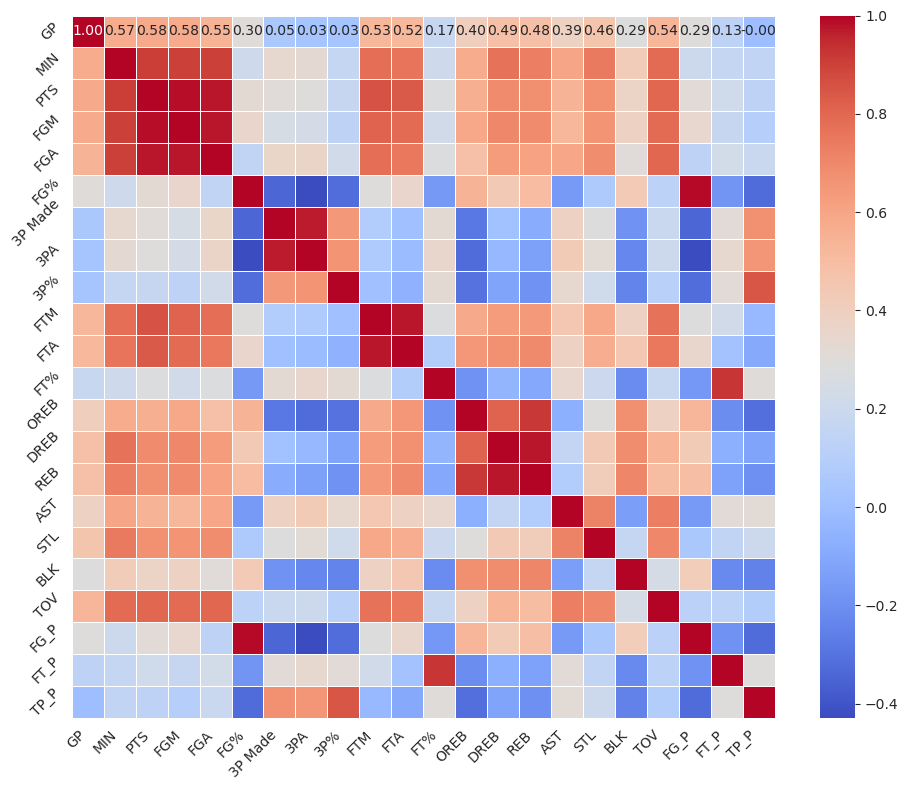

In [304]:
corr = df.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(10, 8))  # Adjust the figure size as needed
sns.heatmap(corr, annot=True, fmt=".2f", cmap='coolwarm', 
            cbar=True, square=True, linewidths=.5)

# Improve the visibility of the heatmap
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=45)
plt.tight_layout()
plt.show()

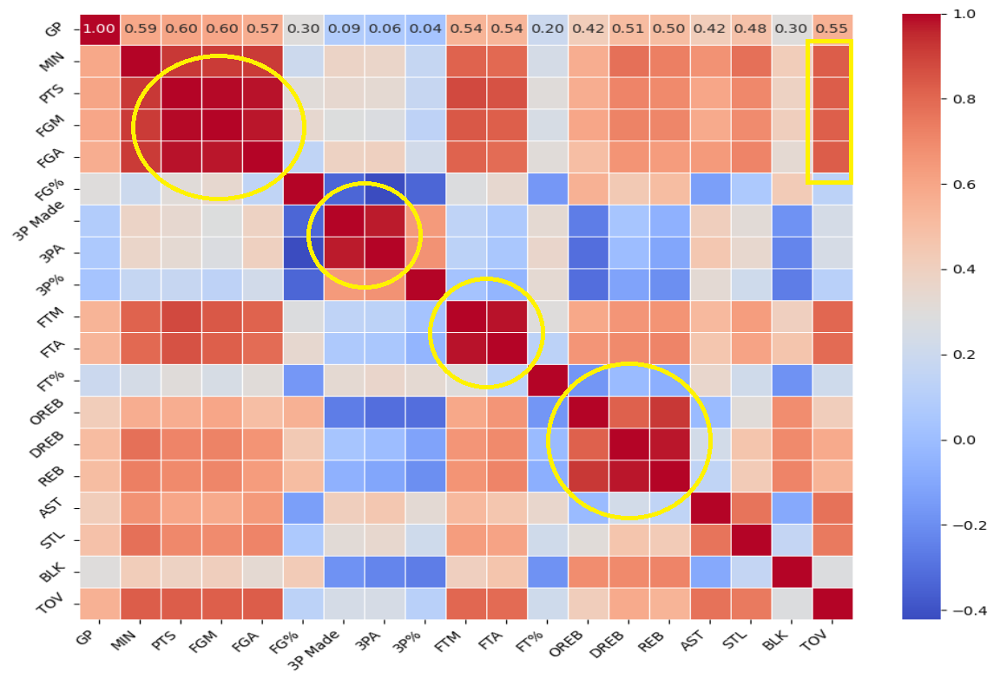

Given the correlation matrix between our predictor features, we can notice that we have four main blocks of features that are highly correlated.

Collinearity and multicollinearity is not beneficial for linear models that we are trying to fit to our dataset. So reducing multicollinearity can help the model improve its performance.

This is because linear models are sensitive to redundant information contained in multicollinearity.

Let's now define ways to filter out those correlated features.

In [305]:
df = numerical_feats.copy()
# let's analyse the first block of highly correlated features ["PTS","FGM","FGA"] feature importance
# let's start by analysing the variance of the features
from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold()
selector.fit_transform(df[["PTS","FGM","FGA"]])
print("Variance of PTS: ", selector.variances_[0])
print("Variance of FGM: ", selector.variances_[1])
print("Variance of FGA: ", selector.variances_[2])

Variance of PTS:  0.22924501150062807
Variance of FGM:  0.15115324332767271
Variance of FGA:  0.19946930938682988


In [306]:
# let's analyse the first block of highly correlated features ["3PA","3P Made"] feature importance
# let's start by analysing the variance of the features
from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold()
selector.fit_transform(df[['3PA','3P Made','3P%', 'TP_P']])
print("Variance of 3PA: ", selector.variances_[0])
print("Variance of 3P Made: ", selector.variances_[1])
print("Variance of 3P%: ", selector.variances_[2])
print("Variance of TP_P: ", selector.variances_[3])

Variance of 3PA:  0.20628355514737126
Variance of 3P Made:  0.054905715724626686
Variance of 3P%:  100.0
Variance of TP_P:  100.0


In [307]:
# let's analyse the first block of highly correlated features ["FTA","FTM"] feature importance
# let's start by analysing the variance of the features
# from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold()  
selector.fit_transform(df[['FTA','FTM','TOV']])
print("Variance of FTA: ", selector.variances_[0])
print("Variance of FTM: ", selector.variances_[1])
print("Variance of TOV: ", selector.variances_[2])

Variance of FTA:  0.13779424057863404
Variance of FTM:  0.10837903040687405
Variance of TOV:  0.07027579497010722


In [308]:
# let's analyse the first block of highly correlated features ["OREB","DREB","REB"] feature importance
# let's start by analysing the variance of the features
from sklearn.feature_selection import VarianceThreshold
selector = VarianceThreshold()
selector.fit_transform(df[['OREB','DREB','REB']])
print("Variance of OREB: ", selector.variances_[0])
print("Variance of DREB: ", selector.variances_[1])
print("Variance of REB: ", selector.variances_[2])


Variance of OREB:  0.1122153336199308
Variance of DREB:  0.1495466022245655
Variance of REB:  0.1994333254002729


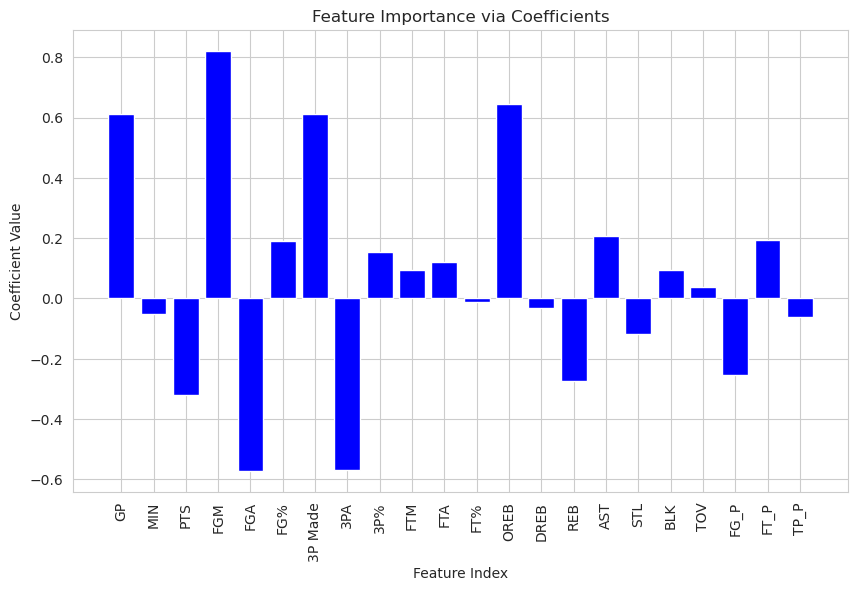

In [309]:
# Getting the coefficients
importance = logreg.coef_[0]
feature_names = [f'{i}' for i in X.columns]
# Plotting feature importance
plt.figure(figsize=(10, 6))
plt.title("Feature Importance via Coefficients")
plt.bar(range(len(importance)), importance, color="b")
plt.xticks(range(len(importance)), feature_names, rotation=90)
plt.ylabel('Coefficient Value')
plt.xlabel('Feature Index')
plt.show()

In [338]:
normalized_feats

,GP,MIN,PTS,FGM,FGA,FG%,3P Made,3PA,3P%,FTM,...,DREB,REB,AST,STL,BLK,TOV,FG_P,FT_P,TP_P,TARGET_5Yrs
0,-1.344918,1.451051,0.552265,0.334692,0.876554,-1.520418,0.992042,1.556243,0.361365,0.710262,...,1.288927,0.861877,0.725005,-0.449119,0.356266,0.494151,-1.586099,-0.090547,0.349140,0.0
1,-1.402437,1.383906,0.501936,-0.134260,0.629046,-2.353863,1.526198,2.004517,0.268212,1.698758,...,0.298547,-0.046058,1.890355,1.492418,0.668985,0.956634,-2.288922,0.531892,0.414664,0.0
2,0.840812,-0.173849,-0.081998,-0.134260,-0.044355,-0.294764,0.697603,1.252071,0.324103,-0.242497,...,0.026095,-0.181811,-0.171754,-0.118752,0.020362,-0.033062,-0.241211,-0.120694,0.333723,0.0
3,-0.079495,-0.670720,0.079988,0.110889,0.249712,-0.229396,-0.331598,-0.042087,0.212320,-0.242497,...,-0.882584,-0.402242,-0.426039,0.190285,-0.736833,-0.033062,-0.359699,-0.120694,0.139466,1.0
4,-0.654688,-0.684148,-0.332212,-0.502333,-0.837360,1.372125,-0.738350,-0.724970,-1.191182,0.337848,...,-0.172918,0.018852,-1.211437,-0.803979,0.356266,-0.430505,1.496613,-0.193680,-0.961323,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1335,1.185927,-0.106705,-0.409575,-0.502333,-0.524427,-0.115002,-0.738350,-0.533393,-0.303125,0.202822,...,-1.022397,-1.020840,1.178864,0.190285,-0.342443,-0.430505,0.063671,0.850028,-0.961323,0.0
1336,0.495697,-0.536430,-0.573469,-0.603213,-0.293394,-1.340655,-0.331598,0.233490,-0.154081,-0.406730,...,-0.623778,-0.734591,1.036854,0.754280,-1.168840,0.494151,-1.203260,0.850028,-0.175045,1.0
1337,-0.942284,-0.603575,-0.015689,0.031740,-0.382967,1.797018,-0.738350,-0.934819,-1.191182,-0.086690,...,0.545010,0.726124,-1.211437,-0.803979,0.356266,-0.226551,1.992632,-0.727394,-0.961323,0.0
1338,-0.424611,-0.617004,-0.332212,-0.405260,-0.429135,-0.016949,-0.738350,-0.533393,-0.570163,0.202822,...,-1.672271,-1.598182,0.962588,-0.449119,-0.736833,-0.430505,0.110807,-0.351818,-0.961323,1.0


In [339]:
feats_to_drop = ["REB","FTA","3P Made","3P%",'FGM',"MIN","STL","FT%"] # based on both variance and feature importance
feats = normalized_feats.drop(columns=feats_to_drop)
X = feats.drop(columns="TARGET_5Yrs")
y = feats["TARGET_5Yrs"]

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)
logreg = LogisticRegression(C= 0.1, class_weight= 'balanced', max_iter= 10, penalty='l1', random_state= 40, solver= 'liblinear') #C= 0.1, class_weight='balanced', max_iter= 100, penalty='l1', random_state= 40, solver= 'liblinear'
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_val)
print(f"Accuracy on Validation Set: {accuracy_score(y_val, y_pred)}")
print(f"recall on Validation Set: {recall_score(y_val, y_pred)}")
print(f"confusion_matrix on Validation Set: {confusion_matrix(y_val, y_pred)}")
print(classification_report(y_val, y_pred))

Accuracy on Validation Set: 0.7137096774193549
recall on Validation Set: 0.6710526315789473
confusion_matrix on Validation Set: [[ 75  21]
 [ 50 102]]
              precision    recall  f1-score   support

         0.0       0.60      0.78      0.68        96
         1.0       0.83      0.67      0.74       152

    accuracy                           0.71       248
   macro avg       0.71      0.73      0.71       248
weighted avg       0.74      0.71      0.72       248



In [340]:
# Calculate metrics
f1 = f1_score(y_val, y_pred)
precision = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
auroc = roc_auc_score(y_val, y_pred)

# Confusion Matrix
cm = confusion_matrix(y_val, y_pred)

print(f"F1 Score: {f1.round(2)}")
print(f"Precision: {precision.round(2)}")
print(f"Recall: {recall.round(2)}")
print(f"AUROC: {auroc.round(2)}")
print("Confusion Matrix:")
print(cm)

F1 Score: 0.74
Precision: 0.83
Recall: 0.67
AUROC: 0.73
Confusion Matrix:
[[ 75  21]
 [ 50 102]]


In [ ]:
joblib.dump(logreg, 'logistic_regression_model.joblib')

In [323]:
from sklearn.model_selection import GridSearchCV
logreg = LogisticRegression()
param_grid = {'C': np.logspace(-3, 3, 7), 'penalty': ['l1', 'l2'], 'solver': ['liblinear'], 'max_iter': [10, 50, 100, 1000, 2500], 'class_weight': ['balanced', 'None']}
logreg_cv = GridSearchCV(logreg, param_grid, cv=5)
logreg_cv.fit(X_train, y_train)
print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
print("accuracy :",logreg_cv.best_score_)


tuned hpyerparameters :(best parameters)  {'C': 0.09999999999999999, 'class_weight': 'balanced', 'max_iter': 10, 'penalty': 'l1', 'solver': 'liblinear'}
accuracy : 0.6717171717171718


['logistic_regression_model.joblib']